# Imports & paths

In [1]:
import os
import sys
import json
from pathlib import Path

import numpy as np
import pandas as pd

os.environ.setdefault("LOKY_MAX_CPU_COUNT", os.environ.get("NUMBER_OF_PROCESSORS", "1"))


def _find_project_root(start: Path) -> Path:
    for p in [start, *start.parents]:
        if (p / "src" / "cnt_project").exists():
            return p
    raise RuntimeError("Could not locate project root containing src/cnt_project")


PROJECT_ROOT = _find_project_root(Path.cwd())

PROJECT_SRC_ROOT = PROJECT_ROOT / "src"
NOTEBOOK_ROOT = PROJECT_ROOT / "notebooks" / "paper_figures"
NOTEBOOK_HELPER_ROOT = NOTEBOOK_ROOT / "src"
LEGACY_NOTEBOOK_ROOT = PROJECT_ROOT / "testing" / "Notebooks" / "Paper_figures"

for p in [
    str(PROJECT_SRC_ROOT),
    str(NOTEBOOK_ROOT),
    str(NOTEBOOK_HELPER_ROOT),
    str(LEGACY_NOTEBOOK_ROOT),
]:
    if p in sys.path:
        sys.path.remove(p)

# Main package: cnt_project.*
sys.path.insert(0, str(PROJECT_SRC_ROOT))

# Notebook helpers: utils.constants, utils.paths, etc.
sys.path.insert(0, str(NOTEBOOK_HELPER_ROOT))

# Legacy helpers fallback
sys.path.insert(1, str(LEGACY_NOTEBOOK_ROOT))

from utils.constants import (
    COLOR_MAP,
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    MICRONS_PER_PIXEL,
)

from utils.paths import (
    Older_MODEL_DIRS,
    OUTPUTS,
    GT_TEST_ANNOTATIONS_PATH,
)

from cnt_project.visualizations.experiments.paper_figures.histogram_plots import (
    plot_features_grid_from_dict,
    save_individual_histograms_per_model_feature,
)

from cnt_project.features.core.cnt_feature_extraction import (
    calculate_cnt_features_from_annotations,
    compute_line_densities_from_polygons,
)
from cnt_project.features.core.coco_centerline_morphology import (
    calculate_centerline_properties_from_json,
)

H, W = IMAGE_HEIGHT, IMAGE_WIDTH

print("PROJECT_ROOT:", PROJECT_ROOT)
print("NOTEBOOK_HELPER_ROOT:", NOTEBOOK_HELPER_ROOT)
print("GT_TEST_ANNOTATIONS_PATH:", GT_TEST_ANNOTATIONS_PATH)

print("\nMODEL_DIRS:")
for key, value in Older_MODEL_DIRS.items():
    print(f"  {key}: {value}")

print("\nCOLOR_MAP keys:")
print(list(COLOR_MAP.keys()))

print("\nOUTPUTS keys:")
print(list(OUTPUTS.keys()))

PROJECT_ROOT: c:\Users\abd93000\PycharmProjects\cnt_project_v2
NOTEBOOK_HELPER_ROOT: c:\Users\abd93000\PycharmProjects\cnt_project_v2\notebooks\paper_figures\src
GT_TEST_ANNOTATIONS_PATH: C:\Users\abd93000\PycharmProjects\cnt_project_v2\data\cnt_segmentation\COCO_mask\default_split\test\annotations_chain_approx_none.json

MODEL_DIRS:
  Nanovision: C:\Users\abd93000\PycharmProjects\cnt_project_v2\global_outputs\runs\fluo_new_edt\inference
  MaskRCNN: C:\Users\abd93000\PycharmProjects\cnt_project_v2\global_outputs\runs\detectron2_trial_1\inference
  WormSwin: C:\Users\abd93000\PycharmProjects\cnt_project_v2\global_outputs\runs\wormswin\inference
  Nano1D: C:\Users\abd93000\PycharmProjects\cnt_project_v2\global_outputs\runs\nano1D\inference

COLOR_MAP keys:
['NanoVision', 'MaskRCNN', 'Nano1D', 'WormSwin', 'GT']

OUTPUTS keys:
['density', 'noise', 'scoring', 'histograms']


# Choose image & build all_results dict (GT + models)

In [2]:
# Pick the filename you want to visualize (just the stem with extension as in GT json)
FILENAME = "400-1093-w11-c1p1-befo3-10sp-15flow_left.tif"  # change if needed

# Map old keys → directories using your MODEL_DIRS (display-name keyed)
MODEL_DIRS_OLD = {
    "modelA": Older_MODEL_DIRS["Nanovision"],
    "modelB": Older_MODEL_DIRS["MaskRCNN"],
    "modelC": Older_MODEL_DIRS["WormSwin"],
    "modelD": Older_MODEL_DIRS["Nano1D"],
}

# Map old keys → display names for legend/colors
MODEL_NAME_MAP = {
    "modelA": "Nanovision",
    "modelB": "MaskRCNN",
    "modelC": "WormSwin",
    "modelD": "Nano1D",
}

# Colors keyed by display names (from constants)
PLOT_COLORS = {
    "Nanovision": COLOR_MAP["NanoVision"],  # note: constants uses NanoVision key
    "MaskRCNN":   COLOR_MAP["MaskRCNN"],
    "WormSwin":   COLOR_MAP["WormSwin"],
    "Nano1D":     COLOR_MAP["Nano1D"],
}

# --- Load GT JSON ---
with open(GT_TEST_ANNOTATIONS_PATH, "r") as f:
    gt_json = json.load(f)

# Find image_id for FILENAME
image_id = None
for img in gt_json.get("images", []):
    if img.get("file_name") == FILENAME:
        image_id = img.get("id"); break
if image_id is None:
    raise ValueError(f"Filename '{FILENAME}' not found in GT images.")

H, W = 256, 256

# --- GT annotations for this image ---
gt_anns = [ann for ann in gt_json.get("annotations", []) if ann.get("image_id") == image_id]
gt_results = {
    "line_density": compute_line_densities_from_polygons(gt_anns, H, W),
    "metrics": calculate_cnt_features_from_annotations(gt_anns, H, W, microns_per_pixel=MICRONS_PER_PIXEL),
}

# --- Models annotations for this image ---
all_results = {"ground_truth": gt_results}

for old_key, model_dir in MODEL_DIRS_OLD.items():
    pred_json = model_dir / "predicted_annotations_poly.json"

    if not pred_json.exists():
        print(f"[warn] Missing predictions: {pred_json}")
        continue

    with open(pred_json, "r") as f:
        pred = json.load(f)

    pred_anns = [
        ann for ann in pred.get("annotations", [])
        if ann.get("image_id") == image_id
    ]

    model_name = MODEL_NAME_MAP[old_key]

    if model_name == "Nano1D":
        metrics = calculate_centerline_properties_from_json(pred_anns, H, W)
    else:
        metrics = calculate_cnt_features_from_annotations(pred_anns, H, W, microns_per_pixel=MICRONS_PER_PIXEL)

    all_results[old_key] = {
        "line_density": compute_line_densities_from_polygons(pred_anns, H, W),
        "metrics": metrics,
    }

list(all_results.keys())

c:\Users\abd93000\PycharmProjects\cnt_project_v2\src\cnt_project\features\core\coco_centerline_morphology.py:273: RuntimeWarning: Mean of empty slice
  output[f"average_{k}"] = float(np.nanmean(output[k])) if output[k] else 0.0


['ground_truth', 'modelA', 'modelB', 'modelC', 'modelD']

In [3]:
list(all_results.keys())

raw_annotations = {
    "ground_truth": gt_anns,
}

for old_key, model_dir in MODEL_DIRS_OLD.items():
    pred_json = model_dir / "predicted_annotations_poly.json"

    if not pred_json.exists():
        print(f"[warn] Missing predictions: {pred_json}")
        continue

    with open(pred_json, "r") as f:
        pred = json.load(f)

    pred_anns = [
        ann for ann in pred.get("annotations", [])
        if ann.get("image_id") == image_id
    ]

    display_name = MODEL_NAME_MAP[old_key]
    raw_annotations[display_name] = pred_anns

for name, anns in raw_annotations.items():
    print(f"{name}: {len(anns)} annotations")

ground_truth: 163 annotations
Nanovision: 183 annotations
MaskRCNN: 60 annotations
WormSwin: 100 annotations
Nano1D: 120 annotations


# Audit cell

c:\Users\abd93000\PycharmProjects\cnt_project_v2\src\cnt_project\features\core\coco_centerline_morphology.py:273: RuntimeWarning: Mean of empty slice
  output[f"average_{k}"] = float(np.nanmean(output[k])) if output[k] else 0.0
c:\Users\abd93000\PycharmProjects\cnt_project_v2\src\cnt_project\features\core\coco_centerline_morphology.py:273: RuntimeWarning: Mean of empty slice
  output[f"average_{k}"] = float(np.nanmean(output[k])) if output[k] else 0.0
c:\Users\abd93000\PycharmProjects\cnt_project_v2\src\cnt_project\features\core\coco_centerline_morphology.py:273: RuntimeWarning: Mean of empty slice
  output[f"average_{k}"] = float(np.nanmean(output[k])) if output[k] else 0.0
c:\Users\abd93000\PycharmProjects\cnt_project_v2\src\cnt_project\features\core\coco_centerline_morphology.py:273: RuntimeWarning: Mean of empty slice
  output[f"average_{k}"] = float(np.nanmean(output[k])) if output[k] else 0.0
c:\Users\abd93000\PycharmProjects\cnt_project_v2\src\cnt_project\features\core\coco_cent

Using 30 images.


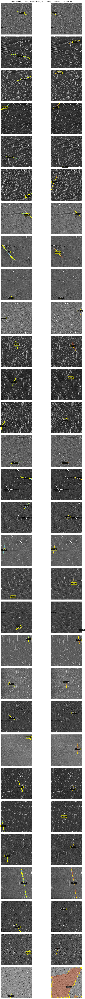

In [4]:
# Visual check: overlay one mask per image and show extracted length (Nanovision vs Nano1D)
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon as MplPolygon

TARGET_MODELS = ["Nanovision", "Nano1D"]
TARGET_COUNT = 30
OVERLAY_COLORS = {"Nanovision": "deepskyblue", "Nano1D": "orangered"}


def _build_ann_index(annotations):
    by_image = {}
    for ann in annotations:
        img_id = ann.get("image_id")
        by_image.setdefault(img_id, []).append(ann)
    return by_image


def _length_for_single_ann(ann, model_name):
    anns = [ann]

    if model_name == "Nano1D":
        metrics = calculate_centerline_properties_from_json( anns, H, W, )
    else:
        metrics = calculate_cnt_features_from_annotations( anns, H, W, microns_per_pixel=MICRONS_PER_PIXEL, )

    vals = np.asarray(
        metrics.get("length_um", []),
        dtype=float,
    )
    vals = vals[np.isfinite(vals)]

    return float(vals[0]) if vals.size else None


def _annotation_to_polygons(ann):
    """Return list of Nx2 polygons from a COCO-style segmentation entry."""
    seg = ann.get("segmentation", [])
    if isinstance(seg, list):
        polys = []
        for poly in seg:
            arr = np.asarray(poly, dtype=float)
            if arr.size >= 6 and arr.size % 2 == 0:
                polys.append(arr.reshape(-1, 2))
        return polys
    return []


def _best_ann_with_length(anns, model_name):
    """Pick the annotation with the largest valid length and valid polygon."""
    best = None
    for ann in anns:
        polys = _annotation_to_polygons(ann)
        if not polys:
            continue
        length_um = _length_for_single_ann(ann, model_name)
        if length_um is None:
            continue
        if best is None or length_um > best["length_um"]:
            best = {"ann": ann, "polys": polys, "length_um": length_um}
    return best


def _candidate_image_paths(image_name):
    gt_parent = GT_TEST_ANNOTATIONS_PATH.parent
    return [
        PROJECT_ROOT / "data" / "annotations_filtered_artifacts" / "test" / "images" / image_name,
        PROJECT_ROOT / "data" / "annotations_uniques" / "test" / "images" / image_name,
        PROJECT_ROOT / "data" / "annotations_v2" / "Test" / image_name,
        gt_parent / "images" / image_name,
        gt_parent / "test" / "images" / image_name,
        PROJECT_ROOT / image_name,
    ]


def _load_base_image(image_name):
    for p in _candidate_image_paths(image_name):
        if p.exists():
            return plt.imread(p), p
    return np.zeros((H, W), dtype=np.float32), None


def _safe_centroid(polys):
    if not polys:
        return (W * 0.5, H * 0.5)
    pts = np.vstack(polys)
    return (float(np.mean(pts[:, 0])), float(np.mean(pts[:, 1])))


# Load GT metadata for image ordering and names
with open(GT_TEST_ANNOTATIONS_PATH, "r") as f:
    gt_all = json.load(f)

image_id_to_name = {img["id"]: img["file_name"] for img in gt_all.get("images", [])}
ordered_image_ids = [img["id"] for img in gt_all.get("images", [])]

# Load predictions for target models
pred_indices = {}
for model_name in TARGET_MODELS:
    pred_path = Older_MODEL_DIRS[model_name] / "predicted_annotations_poly.json"
    if not pred_path.exists():
        raise FileNotFoundError(f"Missing prediction file for {model_name}: {pred_path}")
    with open(pred_path, "r") as f:
        pred_json = json.load(f)
    pred_indices[model_name] = _build_ann_index(pred_json.get("annotations", []))

# Select up to 10 images where both models have at least one valid object
samples = []
for img_id in ordered_image_ids:
    if len(samples) >= TARGET_COUNT:
        break

    per_model = {}
    valid = True
    for model_name in TARGET_MODELS:
        best = _best_ann_with_length(pred_indices[model_name].get(img_id, []), model_name)
        if best is None:
            valid = False
            break
        per_model[model_name] = best

    if valid:
        samples.append({
            "image_id": img_id,
            "image_name": image_id_to_name.get(img_id, f"image_{img_id}"),
            "models": per_model,
        })

if not samples:
    print("No valid samples found for mask overlay + length visualization.")
else:
    n = len(samples)
    if n < TARGET_COUNT:
        print(f"Only found {n} valid images (requested {TARGET_COUNT}).")
    else:
        print(f"Using {n} images.")

    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(11, 3.0 * n), squeeze=False)

    for r, sample in enumerate(samples):
        image_name = sample["image_name"]
        base_img, _ = _load_base_image(image_name)

        for c, model_name in enumerate(TARGET_MODELS):
            ax = axes[r, c]
            ax.imshow(base_img, cmap="gray" if np.ndim(base_img) == 2 else None)

            model_data = sample["models"][model_name]
            overlay_color = OVERLAY_COLORS[model_name]

            for poly in model_data["polys"]:
                patch = MplPolygon(
                    poly,
                    closed=True,
                    facecolor=overlay_color,
                    edgecolor=overlay_color,
                    alpha=0.28,
                    linewidth=2.0,
                )
                ax.add_patch(patch)
                ax.plot(poly[:, 0], poly[:, 1], color="yellow", linewidth=1.4)

            cx, cy = _safe_centroid(model_data["polys"])
            ax.text(
                cx, cy,
                f"{model_data['length_um']:.2f} um",
                color="white",
                fontsize=9,
                ha="center",
                va="center",
                bbox=dict(boxstyle="round,pad=0.25", fc="black", ec="yellow", alpha=0.85),
            )

            if r == 0:
                ax.set_title(model_name, fontweight="bold")

            ax.set_ylabel(f"#{r+1}\n{image_name[:28]}", fontsize=8)
            ax.set_xlim(0, W)
            ax.set_ylim(H, 0)
            ax.axis("off")

    fig.suptitle("Mask Overlay + Length (longest object per image, Nanovision vs Nano1D)", y=0.995, fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.show()

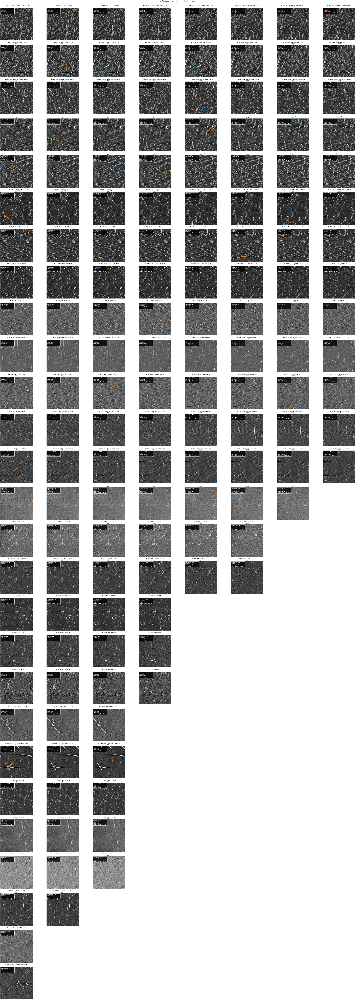

In [6]:
# %%
# Show several multi-polygon GT annotations from each selected image.

GT_MAX_IMAGES = 30
GT_MAX_CASES_PER_IMAGE = 8


def _gt_metrics_for_single_ann(ann):
    """
    Return the current feature-extraction results for one GT annotation.

    The displayed length is exactly what the current implementation returns.
    No additional summation is performed in this visualization.
    """
    metrics = calculate_cnt_features_from_annotations(
        [ann],
        H,
        W,
        microns_per_pixel=MICRONS_PER_PIXEL,
    )

    lengths = np.asarray(
        metrics.get("length_um", []),
        dtype=float,
    )

    component_counts = np.asarray(
        metrics.get("n_connected_components", []),
        dtype=float,
    )

    if lengths.size == 0 or not np.isfinite(lengths[0]):
        return None

    n_components = None

    if (
        component_counts.size > 0
        and np.isfinite(component_counts[0])
    ):
        n_components = int(component_counts[0])

    return {
        "length_um": float(lengths[0]),
        "n_connected_components": n_components,
    }


# Group all GT annotations by image.
gt_ann_index = _build_ann_index(
    gt_all.get("annotations", [])
)

# Collect all annotations containing more than one segmentation polygon.
multi_polygon_cases_by_image = {}

for img_id in ordered_image_ids:
    cases = []

    for ann in gt_ann_index.get(img_id, []):
        polygons = _annotation_to_polygons(ann)

        # We only want annotations containing multiple polygons.
        if len(polygons) <= 1:
            continue

        extracted = _gt_metrics_for_single_ann(ann)

        if extracted is None:
            continue

        cases.append(
            {
                "ann": ann,
                "polys": polygons,
                "length_um": extracted["length_um"],
                "n_connected_components": (
                    extracted["n_connected_components"]
                ),
            }
        )

    if cases:
        # Show longer annotations first within each image.
        cases.sort(
            key=lambda case: case["length_um"],
            reverse=True,
        )

        multi_polygon_cases_by_image[img_id] = cases


# Prefer images containing the most multi-polygon annotations.
selected_image_ids = sorted(
    multi_polygon_cases_by_image,
    key=lambda img_id: len(
        multi_polygon_cases_by_image[img_id]
    ),
    reverse=True,
)[:GT_MAX_IMAGES]


if not selected_image_ids:
    print(
        "No GT annotations containing multiple segmentation polygons "
        "were found."
    )

else:
    n_rows = len(selected_image_ids)

    n_cols = min(
        GT_MAX_CASES_PER_IMAGE,
        max(
            len(multi_polygon_cases_by_image[img_id])
            for img_id in selected_image_ids
        ),
    )

    fig, axes = plt.subplots(
        nrows=n_rows,
        ncols=n_cols,
        figsize=(5 * n_cols, 4 * n_rows),
        squeeze=False,
    )

    polygon_colors = plt.cm.tab10.colors

    for row, img_id in enumerate(selected_image_ids):
        image_name = image_id_to_name.get(
            img_id,
            f"image_{img_id}",
        )

        base_img, image_path = _load_base_image(image_name)

        cases = multi_polygon_cases_by_image[img_id][
            :GT_MAX_CASES_PER_IMAGE
        ]

        for col in range(n_cols):
            ax = axes[row, col]

            # Some images may contain fewer cases than other images.
            if col >= len(cases):
                ax.axis("off")
                continue

            case = cases[col]

            ax.imshow(
                base_img,
                cmap="gray" if np.ndim(base_img) == 2 else None,
            )

            # Plot every polygon belonging to this annotation.
            # Different colors distinguish the individual polygons.
            for polygon_index, polygon in enumerate(case["polys"]):
                color = polygon_colors[
                    polygon_index % len(polygon_colors)
                ]

                patch = MplPolygon(
                    polygon,
                    closed=True,
                    facecolor=color,
                    edgecolor=color,
                    alpha=0.30,
                    linewidth=2,
                )
                ax.add_patch(patch)

                ax.plot(
                    polygon[:, 0],
                    polygon[:, 1],
                    color=color,
                    linewidth=1.5,
                )

            annotation_id = case["ann"].get("id")
            polygon_count = len(case["polys"])
            component_count = case["n_connected_components"]

            # Put the numerical information in the upper-left corner so it
            # does not appear between disconnected fragments.
            ax.text(
                0.02,
                0.98,
                (
                    f"annotation: {annotation_id}\n"
                    f"polygons: {polygon_count}\n"
                    f"components: {component_count}\n"
                    f"summed length: {case['length_um']:.3f} µm"
                ),
                transform=ax.transAxes,
                color="white",
                fontsize=9,
                ha="left",
                va="top",
                bbox={
                    "boxstyle": "round,pad=0.3",
                    "facecolor": "black",
                    "edgecolor": "white",
                    "alpha": 0.80,
                },
            )

            ax.set_title(
                f"{image_name}\ncase {col + 1}",
                fontsize=9,
            )

            ax.set_xlim(0, W)
            ax.set_ylim(H, 0)
            ax.axis("off")

    fig.suptitle(
        "GT annotations containing multiple polygons",
        fontsize=14,
        fontweight="bold",
        y=1.0,
    )

    plt.tight_layout()
    plt.show()

Image: 400-1605-W1_map_00030_bottom_right.tif
Image ID: 18
Total GT annotations: 58


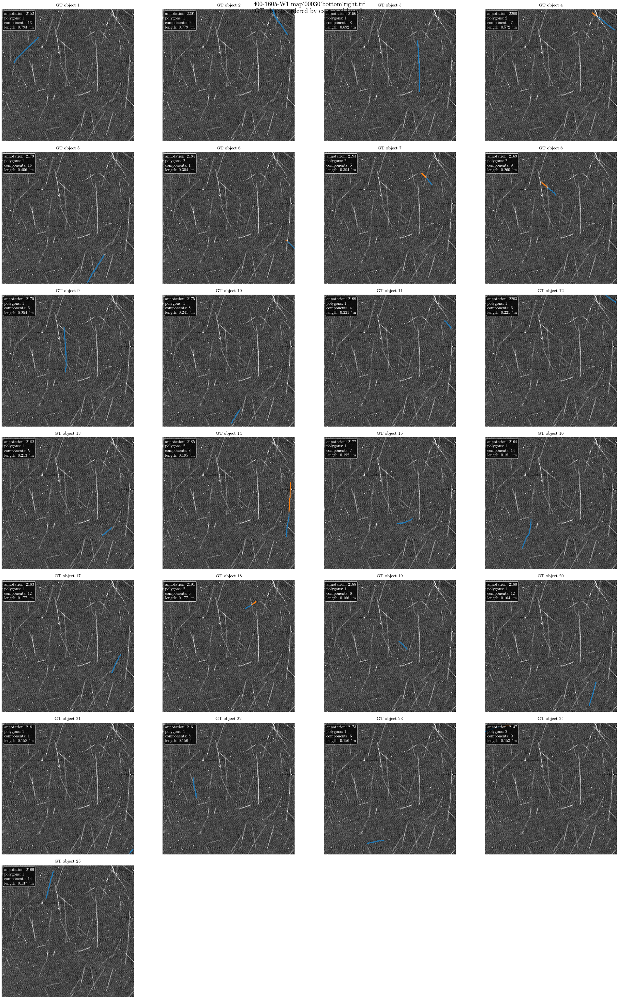

In [11]:
TARGET_IMAGE_STEM = (
    "400-1605-W1_map_00030_bottom_right"
)

MAX_GT_LABELS = 25
N_COLUMNS = 4

# Change to True if you only want annotations containing multiple polygons.
ONLY_MULTI_POLYGON = False

# Change to True if you only want annotations with multiple disconnected
# mask components.
ONLY_DISCONNECTED = False


# Find the image record using the filename without its extension.
target_image_record = next(
    (
        image_record
        for image_record in gt_all.get("images", [])
        if Path(image_record["file_name"]).stem.lower()
        == TARGET_IMAGE_STEM.lower()
    ),
    None,
)

if target_image_record is None:
    raise ValueError(
        f"Image not found in GT JSON: {TARGET_IMAGE_STEM}"
    )

target_image_id = target_image_record["id"]
target_image_name = target_image_record["file_name"]

target_annotations = [
    ann
    for ann in gt_all.get("annotations", [])
    if ann.get("image_id") == target_image_id
]

print("Image:", target_image_name)
print("Image ID:", target_image_id)
print("Total GT annotations:", len(target_annotations))


# Extract polygons, lengths and component counts.
target_cases = []

for ann in target_annotations:
    polygons = _annotation_to_polygons(ann)

    if not polygons:
        continue

    if ONLY_MULTI_POLYGON and len(polygons) <= 1:
        continue

    extracted = _gt_metrics_for_single_ann(ann)

    if extracted is None:
        continue

    n_components = extracted["n_connected_components"]

    if (
        ONLY_DISCONNECTED
        and (n_components is None or n_components <= 1)
    ):
        continue

    target_cases.append(
        {
            "ann": ann,
            "polys": polygons,
            "length_um": extracted["length_um"],
            "n_connected_components": n_components,
        }
    )


# Display the longest objects first.
target_cases.sort(
    key=lambda case: case["length_um"],
    reverse=True,
)

target_cases = target_cases[:MAX_GT_LABELS]


if not target_cases:
    print("No matching GT annotations found for the selected filters.")

else:
    base_img, image_path = _load_base_image(
        target_image_name
    )

    n_cases = len(target_cases)
    n_cols = min(N_COLUMNS, n_cases)
    n_rows = int(np.ceil(n_cases / n_cols))

    fig, axes = plt.subplots(
        nrows=n_rows,
        ncols=n_cols,
        figsize=(5 * n_cols, 4.5 * n_rows),
        squeeze=False,
    )

    polygon_colors = plt.cm.tab10.colors

    for case_index, ax in enumerate(axes.flat):
        if case_index >= n_cases:
            ax.axis("off")
            continue

        case = target_cases[case_index]

        ax.imshow(
            base_img,
            cmap="gray" if np.ndim(base_img) == 2 else None,
        )

        # Draw all polygons belonging to this annotation.
        for polygon_index, polygon in enumerate(case["polys"]):
            color = polygon_colors[
                polygon_index % len(polygon_colors)
            ]

            patch = MplPolygon(
                polygon,
                closed=True,
                facecolor=color,
                edgecolor=color,
                alpha=0.35,
                linewidth=2,
            )
            ax.add_patch(patch)

            ax.plot(
                polygon[:, 0],
                polygon[:, 1],
                color=color,
                linewidth=1.5,
            )

        annotation_id = case["ann"].get("id")
        polygon_count = len(case["polys"])
        component_count = case["n_connected_components"]

        ax.text(
            0.02,
            0.98,
            (
                f"annotation: {annotation_id}\n"
                f"polygons: {polygon_count}\n"
                f"components: {component_count}\n"
                f"length: {case['length_um']:.3f} µm"
            ),
            transform=ax.transAxes,
            color="white",
            fontsize=9,
            ha="left",
            va="top",
            bbox={
                "boxstyle": "round,pad=0.3",
                "facecolor": "black",
                "edgecolor": "white",
                "alpha": 0.80,
            },
        )

        ax.set_title(
            f"GT object {case_index + 1}",
            fontsize=10,
            fontweight="bold",
        )

        ax.set_xlim(0, W)
        ax.set_ylim(H, 0)
        ax.axis("off")

    fig.suptitle(
        (
            f"{target_image_name}\n"
            f"GT objects ordered by extracted length"
        ),
        fontsize=14,
        fontweight="bold",
    )

    plt.tight_layout()
    plt.show()

# Plot (GT overlaid on rows, default)

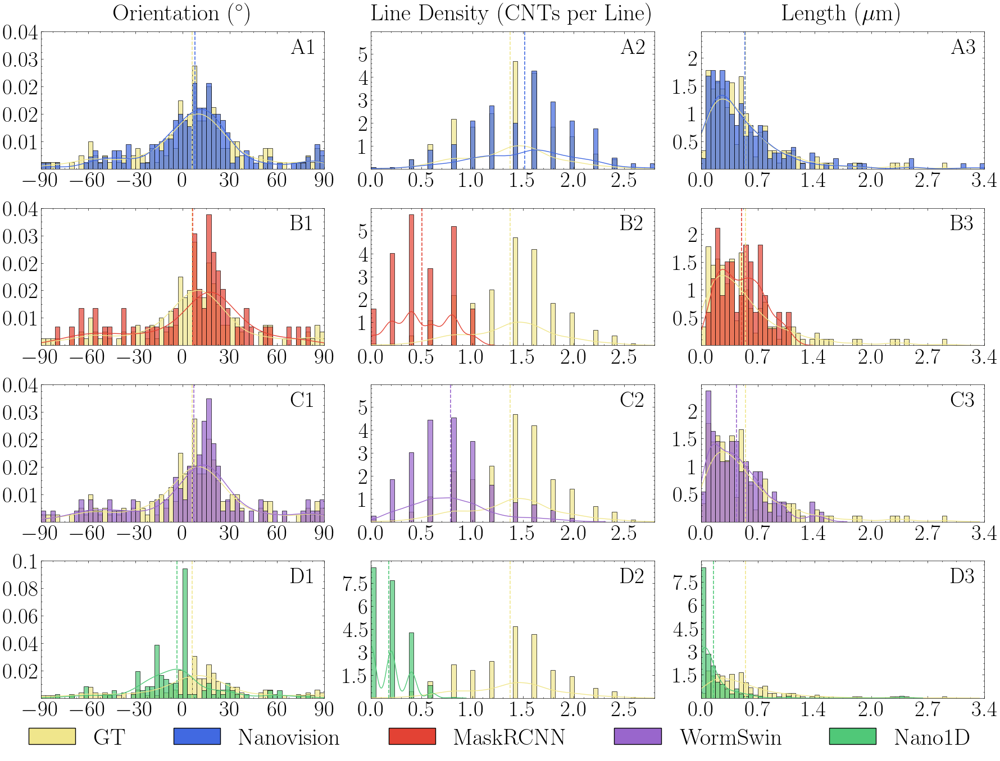

Saved: C:\Users\abd93000\PycharmProjects\cnt_project_v2\notebooks\paper_figures\outputs\histograms\features_grid_400-1093-w11-c1p1-befo3-10sp-15flow_left.svg


In [5]:
features = ["orientation_angle", "line_density", "length_um"]
feature_labels = [r"Orientation ($^\circ$)", r"Line Density (CNTs per Line)", r"Length ($\mu$m)"]

save_dir = OUTPUTS.setdefault("histograms", OUTPUTS["scoring"].parent / "histograms")
save_dir.mkdir(parents=True, exist_ok=True)

filename_base = f"features_grid_{Path(FILENAME).stem}"

plot_features_grid_from_dict(
    all_results=all_results,
    features=features,
    feature_labels=feature_labels,
    filename_base=filename_base,
    save_folder=save_dir,
    color_map=PLOT_COLORS,          
    model_name_map=MODEL_NAME_MAP,  
    bins=60,
    hist_stat="density",
    gt_in_separate_row=False,       
)

print("Saved:", (save_dir / f"{filename_base}.svg"))

# Plot (GT in a separate bottom row) to be used later to integrate FFT 

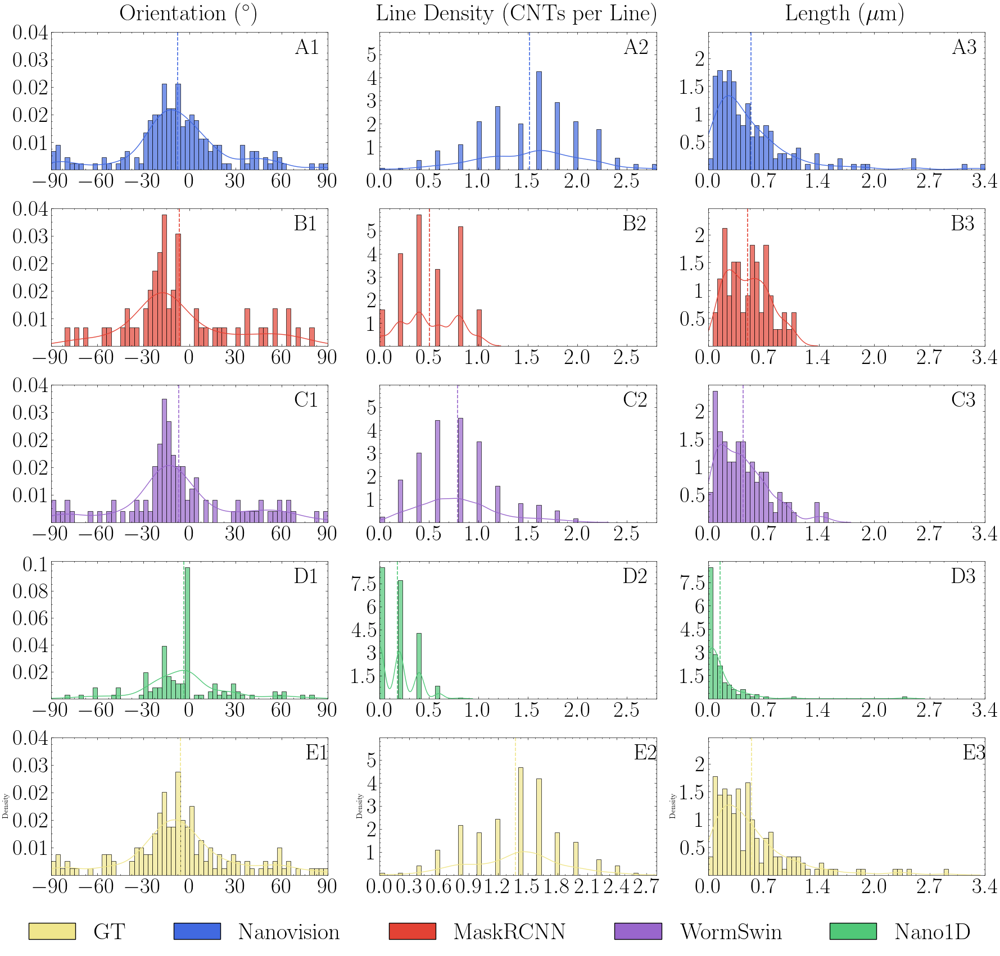

Saved: C:\Users\abd93000\PycharmProjects\cnt_project_v2\notebooks\paper_figures\outputs\histograms\400-1093-w11-c1p1-befo3-10sp-15flow_left_gt_separate.svg


In [6]:
plot_features_grid_from_dict(
    all_results=all_results,
    features=["orientation_angle", "line_density", "length_um"],
    feature_labels=[r"Orientation ($^\circ$)", r"Line Density (CNTs per Line)", r"Length ($\mu$m)"],
    filename_base=f"{Path(FILENAME).stem}_gt_separate",
    save_folder=save_dir,
    color_map=PLOT_COLORS,
    model_name_map=MODEL_NAME_MAP,
    bins=60,
    hist_stat="density",
    gt_in_separate_row=True,   # GT separate row
)

print("Saved:", (save_dir / f"{Path(FILENAME).stem}_gt_separate.svg"))

In [7]:
from src.plotting.histogram_plots import save_individual_histograms_per_model_feature

paths = save_individual_histograms_per_model_feature(
    all_results,
    features,
    feature_labels,
    save_dir,
    color_map=PLOT_COLORS,
    model_name_map=MODEL_NAME_MAP,
    figsize=(2.0, 1.8)   
)
print("Saved:", (save_dir))

Saved: C:\Users\abd93000\PycharmProjects\cnt_project_v2\notebooks\paper_figures\outputs\histograms
